## SUPERVISION LEARNING - DECISION TREES

To create a decision tree model that can predict the survival of passengers on the Titanic. 

In [1]:
# Import libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
import seaborn as sns

In [2]:
# Import the dataset
titanic_df = pd.read_csv("titanic.csv")

# Check the first five observations
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [3]:
# Check dataset information
titanic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


This dataset has 10 columns where passengerId, Survived, Pclass, Age, Sibsp, Parch, Fare columns have numerical data. 
The rest of the columns are of object datatype. 
The columns 'Age', 'Cabin' and 'Embarked' have missing information. 

In [4]:
# Drop the columns 'Cabin', 'Name', 'Ticket'
titanic_df.drop("Cabin", axis=1, inplace=True)
titanic_df.drop("Name", axis=1, inplace=True)
titanic_df.drop("Ticket", axis=1, inplace=True)

Drop the columns 'Cabin', 'Name' and 'Ticket' from the dataset as they are not necessary to predict the output. 

In [5]:
# Check for null values in the 'Embarked' and 'Age' column 
print("Missing values in 'Embarked' column : ",titanic_df['Embarked'].isnull().sum())
print("Missing values in 'Age' column : ",titanic_df['Age'].isnull().sum())

Missing values in 'Embarked' column :  2
Missing values in 'Age' column :  177


We will have to handle the missing information for the columns 'Embarked' and 'Age'. We will use 'median' and 'mode' values to fill in the missing information for the columns 'Age' and 'Embarked' respectively.

In [6]:
# Handling missing values in 'Embarked' and 'Age' column 
titanic_df['Age'] = titanic_df['Age'].fillna(titanic_df['Age'].median())
titanic_df['Embarked'] = titanic_df['Embarked'].fillna(titanic_df['Embarked'].mode()[0])

In [7]:
# Check if the missing values are filled. 
titanic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Sex          891 non-null    object 
 4   Age          891 non-null    float64
 5   SibSp        891 non-null    int64  
 6   Parch        891 non-null    int64  
 7   Fare         891 non-null    float64
 8   Embarked     891 non-null    object 
dtypes: float64(2), int64(5), object(2)
memory usage: 62.8+ KB


We dont have any missing information. 
### One-Hot Encoding
One-hot encoding is a technique used to ensure that categorical variables are better represented in the machine. Let's take a look at the "Sex" column and 'Embarked' column.

In [8]:
titanic_df["Sex"].unique()

array(['male', 'female'], dtype=object)

In [9]:
titanic_df["Embarked"].unique()

array(['S', 'C', 'Q'], dtype=object)

Machine Learning classifiers don't know how to handle strings. As a result, you need to convert it into a categorical representation. There are two main ways to go about this:

Label Encoding: Assigning, for example, 0 for "male" and 1 for "female". The problem here is it intrinsically makes one category "larger than" the other category.

One-hot encoding: Assigning, for example, [1, 0] for "male" and [0, 1] for female. In this case, you have an array of size (n_categories,) and you represent a 1 in the correct index, and 0 elsewhere. In Pandas, this would show as extra columns. For example, rather than having a "Sex" column, it would be a "Sex_male" and "Sex_female" column. Then, if the person is male, it would simply show as a 1 in the "Sex_male" column and a 0 in the "Sex_female" column.

There is a nice and easy method that does this in pandas: get_dummies()

In [10]:
titanic_df = pd.get_dummies(titanic_df, prefix="Sex", columns=["Sex"])
titanic_df.head()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,Embarked,Sex_female,Sex_male
0,1,0,3,22.0,1,0,7.2500,S,False,True
1,2,1,1,38.0,1,0,71.2833,C,True,False
2,3,1,3,26.0,0,0,7.9250,S,True,False
3,4,1,1,35.0,1,0,53.1000,S,True,False
4,5,0,3,35.0,0,0,8.0500,S,False,True


Now, we do the same for the "Embarked" column. We will now have 'Embarked_C', 'Embarked_Q, 'Embarked_S'columns.

In [11]:
titanic_df = pd.get_dummies(titanic_df, prefix="Embarked", columns=["Embarked"])
titanic_df.head()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,1,0,3,22.0,1,0,7.2500,False,True,False,False,True
1,2,1,1,38.0,1,0,71.2833,True,False,True,False,False
2,3,1,3,26.0,0,0,7.9250,True,False,False,False,True
3,4,1,1,35.0,1,0,53.1000,True,False,False,False,True
4,5,0,3,35.0,0,0,8.0500,False,True,False,False,True


In [12]:
# Select the dependent and independent variables
X = titanic_df.drop('Survived', axis = 1)
y = titanic_df['Survived']

X - will have all the features except the dependent variable 'Survived'

y - dependent variable ('Survived')

In [13]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Pclass       891 non-null    int64  
 2   Age          891 non-null    float64
 3   SibSp        891 non-null    int64  
 4   Parch        891 non-null    int64  
 5   Fare         891 non-null    float64
 6   Sex_female   891 non-null    bool   
 7   Sex_male     891 non-null    bool   
 8   Embarked_C   891 non-null    bool   
 9   Embarked_Q   891 non-null    bool   
 10  Embarked_S   891 non-null    bool   
dtypes: bool(5), float64(2), int64(4)
memory usage: 46.2 KB


In [14]:
# Split the original dataset into training and test sets
X_trainfull , X_test , y_trainfull, y_test = train_test_split( X, y, test_size = 0.2, random_state = 42)

# Split the training set into training and development sets
X_train, X_dev, y_train, y_dev = train_test_split(X_trainfull, y_trainfull, test_size = 0.2, random_state = 42)



In [15]:
# Train and fit the Decision Tree
unpruned_model = DecisionTreeClassifier(max_depth=None, random_state=42)

unpruned_model.fit(X_train, y_train)


DecisionTreeClassifier(random_state=42)

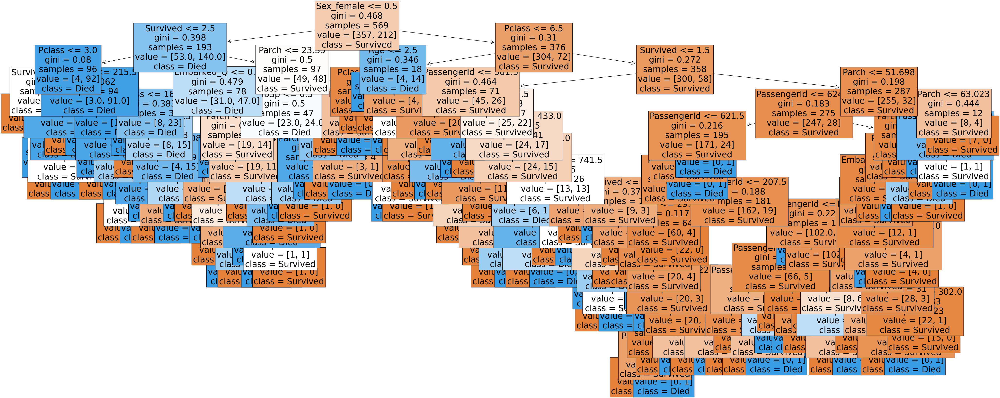

In [16]:
# Make a plot of the Decision Tree.
plt.figure(figsize=(50,20))
features = titanic_df.columns
classes = ['Survived','Died']
tree.plot_tree(unpruned_model,feature_names=features,class_names=classes,filled=True,fontsize=25)
plt.show()


In [17]:
# Compute model’s accuracy on the development set.
print("Performance on development set : " , unpruned_model.score(X_dev,y_dev))
print("At depth : ", unpruned_model.tree_.max_depth)

Performance on development set :  0.7342657342657343
At depth :  16


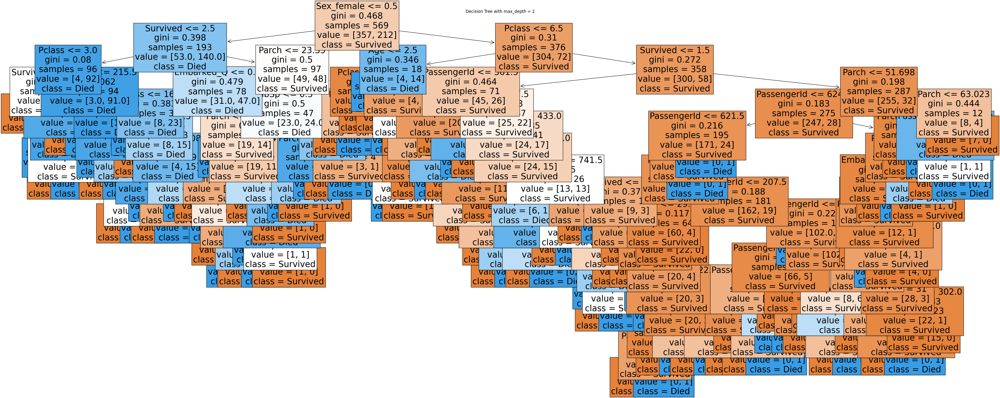

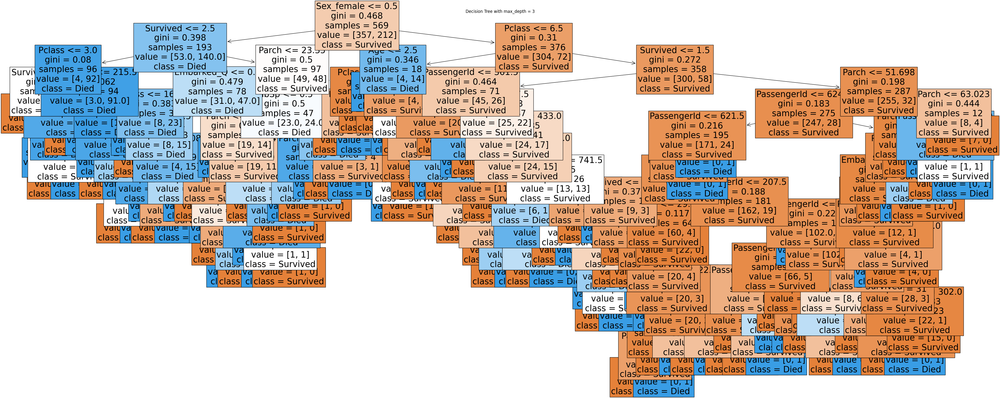

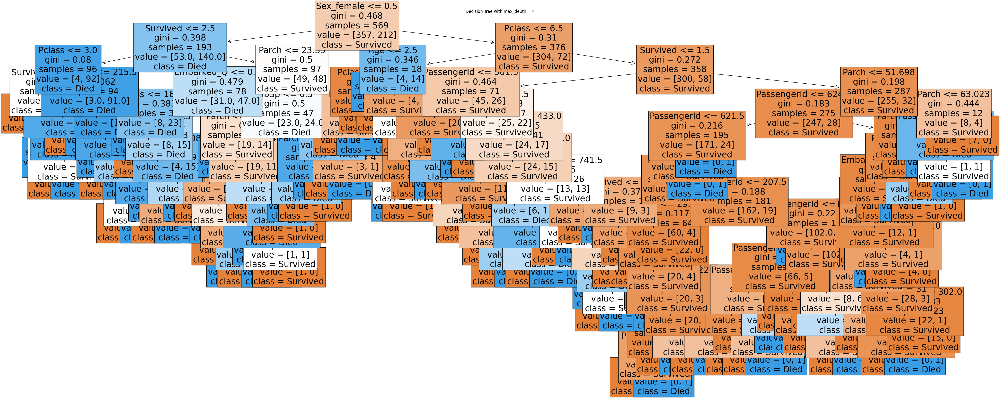

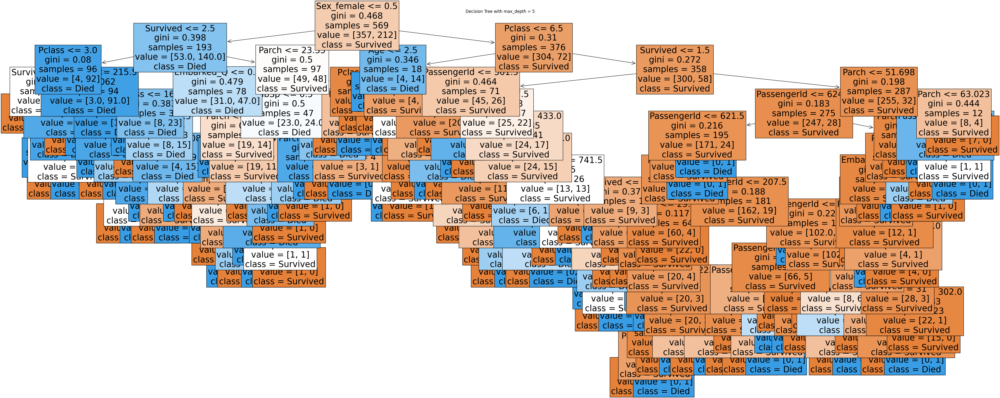

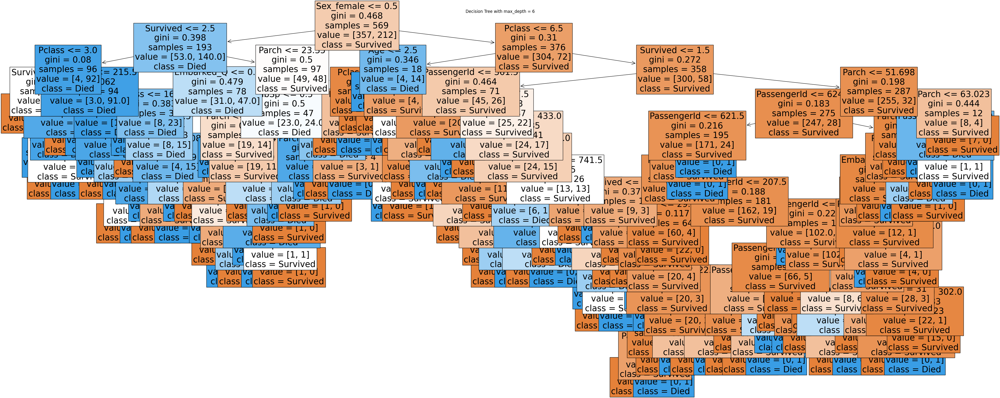

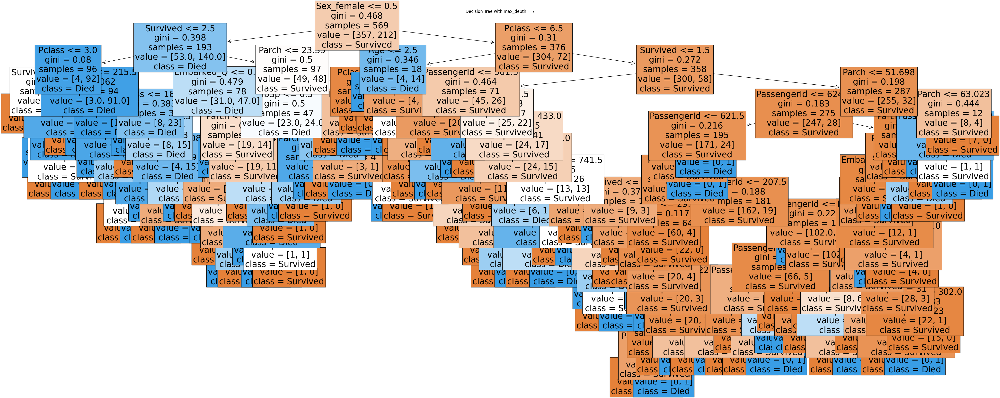

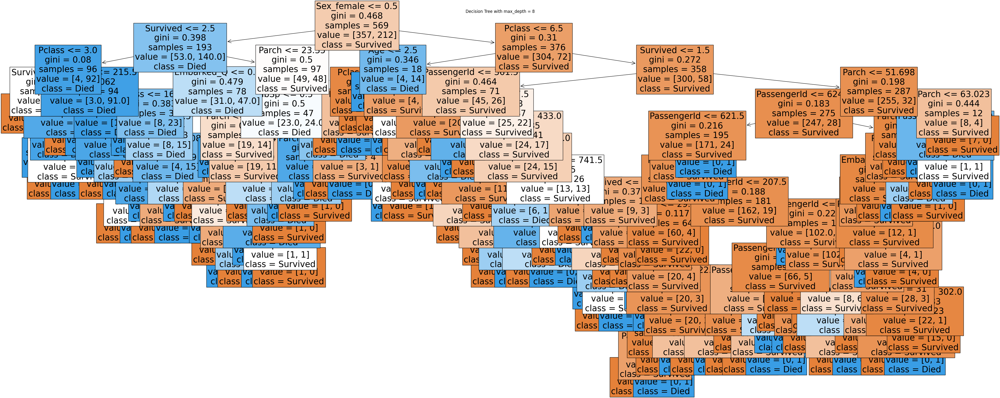

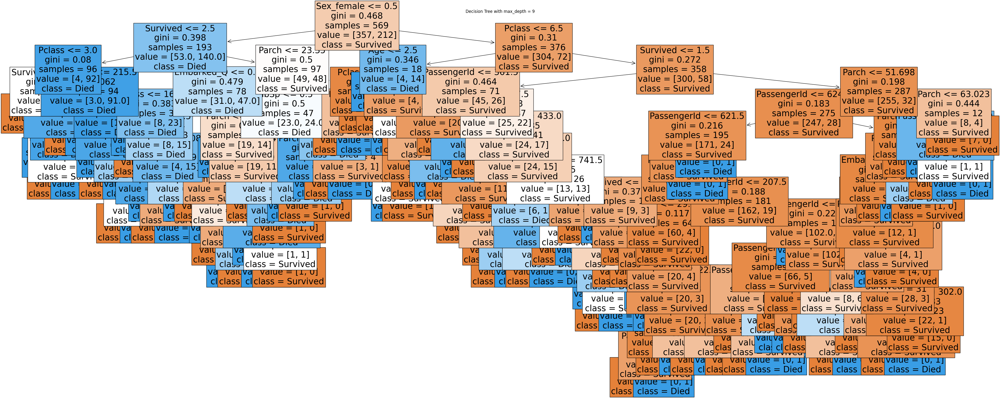

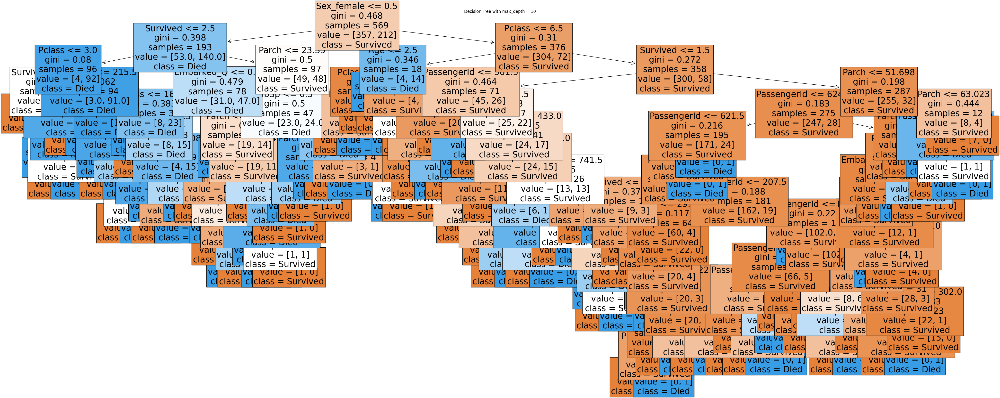

In [18]:
# Building model with different values of max_depth (2-10).

# Lists to store accuracies for training and development sets
train_accuracy = []
dev_accuracy = []
pruned_depths = range(2,11)

# Train and plot decision tree for different max_depth values
for max_depth in pruned_depths:
    clf = DecisionTreeClassifier(max_depth = max_depth)
    clf.fit(X_train,y_train)

    # Calculate accuracies
    train_score = clf.score(X_train,y_train)
    train_accuracy.append(train_score)
    dev_score = clf.score(X_dev,y_dev)
    dev_accuracy.append(dev_score)

    # Plot the decision tree at each step
    plt.figure(figsize=(50,20))
    features = titanic_df.columns
    classes = ['Survived','Died']
    tree.plot_tree(unpruned_model,feature_names=features,class_names=classes,filled=True,fontsize=25)
    plt.title(f"Decision Tree with max_depth = {max_depth}")
    plt.show()

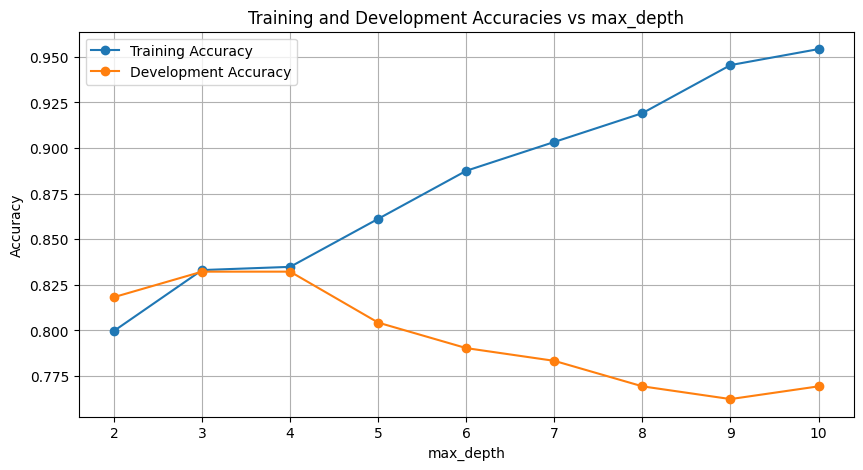

In [19]:
# Plot training and development accuracies in the same graph
plt.figure(figsize=(10, 5))
plt.plot(range(2, 11), train_accuracy, label='Training Accuracy', marker='o')
plt.plot(range(2, 11), dev_accuracy, label='Development Accuracy', marker='o')
plt.xlabel('max_depth')
plt.ylabel('Accuracy')
plt.title('Training and Development Accuracies vs max_depth')
plt.legend()
plt.grid(True)

The graph shows two lines representing the accuracies of the decision tree classifier on the training and development datasets as the max_depth parameter varies from 2 to 10.

## Shape and interpretation of the Lines

### Training Accuracy Line (Blue):

The line starts at a moderate accuracy level and steadily increases as max_depth increases.
It appears to rise almost linearly, approaching or reaching near-perfect accuracy as max_depth reaches 10.

Increasing Accuracy: The training accuracy increases as the depth of the tree increases because a deeper tree can create more complex decision boundaries, fitting the training data better.

Overfitting Indicator: The continuous rise in training accuracy, especially when it approaches 100%, indicates that the model is overfitting the training data. This means it is capturing noise and details specific to the training set, rather than learning the general pattern.


### Development Accuracy Line (Orange):

The line starts at a moderate accuracy level and initially increases slightly as max_depth increases from 2 to 3.
After that, it plateaus and starts to decrease gradually as max_depth continues to increase, showing a downward trend.

Initial Increase: The initial rise in development accuracy (up to max_depth = 3) suggests that increasing the tree depth initially helps the model capture more relevant patterns in the data, improving generalization.

Plateau and Decrease: The plateau and subsequent decrease in development accuracy after a certain depth (around max_depth = 4) indicate that the model starts to overfit. As the model becomes too complex, it performs well on the training data but poorly on unseen data (development set).

In [20]:
# Fitting the chosen tree with best depth value
best_depth = pruned_depths[np.argmax(dev_accuracy)]
print('Best performance reached at depth of:', best_depth)

pruned = DecisionTreeClassifier(max_depth=best_depth, random_state = 42)
pruned.fit(X_train, y_train)

Best performance reached at depth of: 3


DecisionTreeClassifier(max_depth=3, random_state=42)

In [21]:
# Evaluate the accuracy of the final model on the test data
test_accuracy = pruned.score(X_test,y_test)
print("Test Accuracy : ", test_accuracy)

Test Accuracy :  0.7988826815642458


## TASK 21  -  SUPERVISED LEARNING - RANDOM FORESTS

Now lets create a bagged, random forest, and boosted tree for the Titanic data set.

Bagging  Accuracy : 0.8212290502793296
Random Forest  Accuracy : 0.8435754189944135
Gradient Boosting  Accuracy : 0.8268156424581006


Text(0.5, 1.0, 'Model Accuracies on Titanic Dataset')

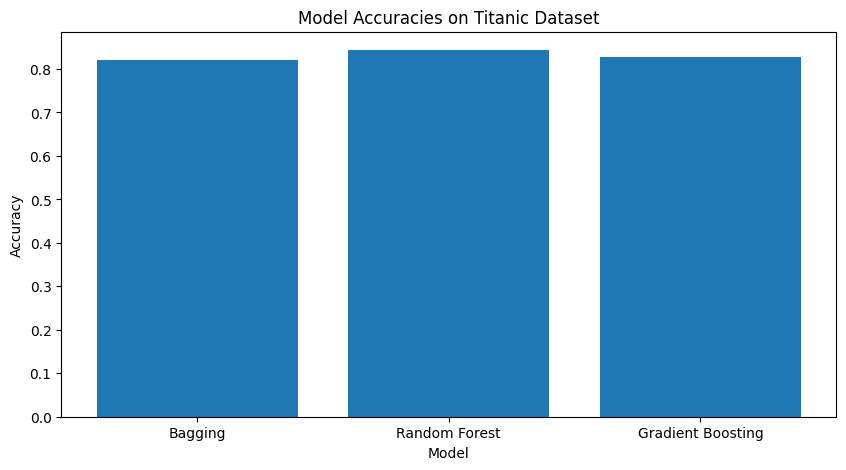

In [22]:
# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.2, random_state = 42)

# Define and train models
models = { 
    'Bagging' : BaggingClassifier(n_estimators = 100, random_state = 42),
    'Random Forest' : RandomForestClassifier(n_estimators = 100, random_state = 42),
    'Gradient Boosting' : GradientBoostingClassifier(n_estimators = 100, random_state = 42)
}

# Train and evaluate each model
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"{model_name}  Accuracy : {accuracy}")


# Plot Accuracies
accuracies =[]
for model in models.values():
    y_pred = model.predict(X_test)
    model_accuracy = accuracy_score(y_test, y_pred)
    accuracies.append(model_accuracy)

model_names = list(models.keys())

plt.figure(figsize = (10,5))
plt.bar(model_names, accuracies)
plt.xlabel("Model")
plt.ylabel("Accuracy")
plt.title('Model Accuracies on Titanic Dataset')
    
    

From the bar plot and accuracies, we can see that accuracy of Random Forest is a bit better than bagging, and gradient boosting.

## Feature Importance
Lets determine which of the features contributes the most to predicting whether a passenger survives or not.

In [23]:
random_forest = RandomForestClassifier(n_estimators = 100, random_state = 42)
random_forest.fit(X_train, y_train)

#Finding the important features using the built-in Gini importance

# Extract feature importance
importances  = random_forest.feature_importances_
feature_names = X.columns

# Dataframe with features and importances, # Sort the feature importances by most important first
feature_imp_df = pd.DataFrame({'Feature' : feature_names, 'Importance' : importances}).sort_values('Importance' , ascending = False)
feature_imp_df

,Feature,Importance
0,PassengerId,0.187774
5,Fare,0.179377
2,Age,0.168225
7,Sex_male,0.151250
6,Sex_female,0.126551
1,Pclass,0.078645
3,SibSp,0.044696
4,Parch,0.030121
10,Embarked_S,0.013957
8,Embarked_C,0.012620


We can see that the most important features that are contributing to predicting the survival chances of a passenger are:
1. PassengerId
2. Fare
3. Age
4. Sex_male
5. Sex_female

## Hyper parameter tuning

In [24]:
params = {
    'max_depth' : [2,3,5,10,20],
    'n_estimators' : [10,25,30,50,100,200]
}

# Instantiate the grid search model
grid_search = GridSearchCV(estimator = random_forest, 
                           param_grid = params,
                           cv=4,
                           n_jobs=-1, verbose = 1, scoring ="accuracy")
grid_search.fit(X_train, y_train)


Fitting 4 folds for each of 30 candidates, totalling 120 fits


GridSearchCV(cv=4, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 20],
                         'n_estimators': [10, 25, 30, 50, 100, 200]},
             scoring='accuracy', verbose=1)

In [25]:
# Print the best parameters and the corresponding accuracy
best_params = grid_search.best_params_
best_rf = grid_search.best_estimator_
print(f"Best Parameters: {best_params}")
print(f"Best Training Accuracy: {grid_search.best_score_}")

Best Parameters: {'max_depth': 5, 'n_estimators': 200}
Best Training Accuracy: 0.8300561797752809


In [26]:
# Evaluate the best model on the test set
y_test_pred = best_rf.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy: {test_accuracy}")

Test Accuracy: 0.8044692737430168


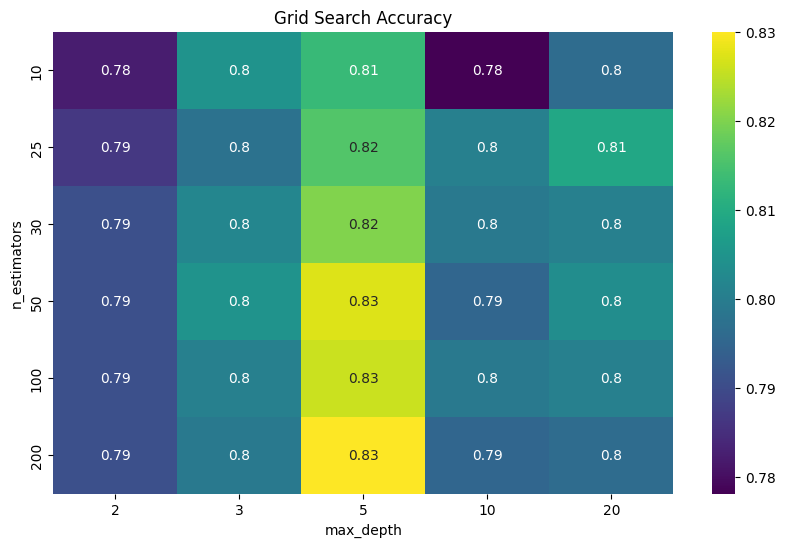

In [27]:
# Plot the grid search results
results = pd.DataFrame(grid_search.cv_results_)
pivot_table = results.pivot_table(values='mean_test_score', index='param_n_estimators', columns='param_max_depth')


plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap='viridis')
plt.title('Grid Search Accuracy')
plt.xlabel('max_depth')
plt.ylabel('n_estimators')
plt.show()

## Model Performance Report:
### Bagging Classifier
Accuracy: 0.8212290502793296
### Random Forest Classifier
Accuracy: 0.8435754189944135
### Gradient Boosting Classifier
Accuracy: 0.8268156424581006
### Hyperparameter Tuning of Gradient Boosting Classifier
Best Parameters: max_depth = 5, n_estimators = 200

Best Training Accuracy: 0.8300561797752809

Test Accuracy (after hyperparameter tuning): 0.8044692737430168
## Best Performing Model:
The Random Forest Classifier performed the best among all the models with an accuracy of 0.8435754189944135.
It achieved the highest accuracy on the dataset. Even after hyperparameter tuning, the Gradient Boosting model did not surpass the performance of the Random Forest model. Therefore, the Random Forest Classifier is considered the best model for this task, providing the highest accuracy in predicting whether a passenger survived the Titanic disaster.